# Quantization in the Frequency Domain (Spectral Domain)

This code is provided as supplementary material of the lecture Quellencodierung.

This code illustrates
* Carrying out the quantization in the frequency domain with optimized bit assignment

In [206]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as sp
import librosa
import math
import shutil
import librosa.display
import IPython.display as ipd

In [235]:
wave_filename = '../audio/KIMIKO ISHIZAKA - Goldberg Variations BWV 988 - 01 - Aria_45s.wav'
#wave_filename = '../audio/33711__acclivity__excessiveexposure.wav'
#wave_filename = '../audio/E-Core - Pingouin-Banquise_45s.wav'

print('Audio playback original: ')
x, sampling_rate = librosa.load(wave_filename, sr=22050)
ipd.display(ipd.Audio(x, rate=sampling_rate))

Audio playback original: 


In [236]:
window_types = ['hamming','hann','rect']

def get_window(window_type, n):
    if window_type == 'rect':
        return np.ones(n)
    else:
        return sp.get_window(window_type, n)
    
def get_spectrogram(x, sampling_rate, M):
    window = get_window('hann',M)

    step = M // 4

    s_indices = np.arange(0,len(x)-M,step)

    spectrogram = np.zeros((M//2, len(s_indices)))

    for idx,k in enumerate(s_indices):
        x_part = x[k + np.arange(M)] * window
        X_part = np.fft.rfft(x_part)
        spectrogram[:,idx] = 10*np.log10(np.abs(X_part[0:(M//2)]))

    frequencies = np.linspace(0, sampling_rate//2, M//2)
    times = s_indices * (1 / sampling_rate)
    
    return times,frequencies,spectrogram

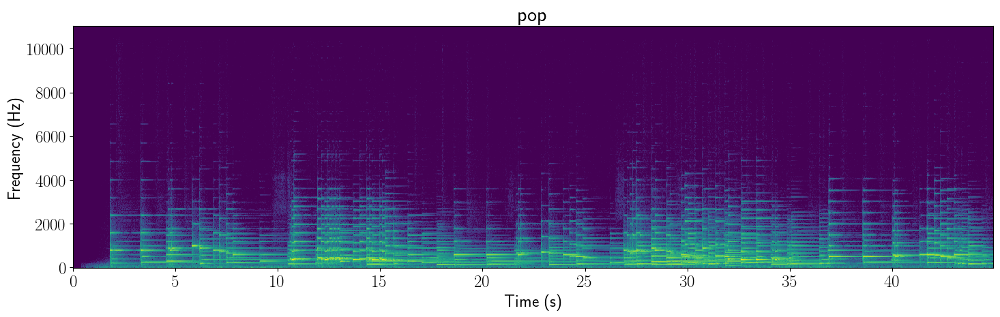

In [237]:
font = {'size'   : 18}
plt.rc('font', **font)
plt.rc('text', usetex=True if shutil.which('latex') else False)

plt.figure(figsize=(15, 5))

times,frequencies,spectrogram = get_spectrogram(x, sampling_rate, 1024)

#  only use a dynamic range of 47 dB
v_min = np.max(spectrogram)-47

plt.pcolormesh(times, frequencies, spectrogram, vmin=v_min, cmap='viridis')
plt.ylabel(r'Frequency (Hz)')
plt.xlabel(r'Time (s)')
plt.title(key)
    
plt.tight_layout()
#plt.savefig('spectrogram_3x1.png',bbox_inches='tight',dpi=72)

----
#### Unoptimized quantization in the frequency domain
Carry out quantization in the frequency domain. For this, chop the signal into slices and transform each slice of length $M$ into the frequency domain and then carry out quantization with a uniform scalar midtreat quantizer with $w$ bit resolution.

In [246]:
def analysis_synthesis_uniformQ(x, sampling_rate, M, w):
    # we start with a rect window
    window_function = 'rect'    # 'hann'
    window = get_window(window_function,M)
    step = M if window_function == 'rect' else M // 2

        
    s_indices = np.arange(0,len(x)-M,step)

    X_real = np.zeros((1 + M//2, len(s_indices)))
    X_imag = np.zeros((1 + M//2, len(s_indices)))
       

    # spectral analysis
    for idx,k in enumerate(s_indices):
        x_part = x[k + np.arange(M)] * window
        X_part = np.fft.rfft(x_part)
        
        X_real[:,idx] = np.real(X_part)
        X_imag[:,idx] = np.imag(X_part)

    X_maxabs_real = np.max(np.abs(X_real), axis=1)
    X_maxabs_imag = np.max(np.abs(X_imag), axis=1)
    Delta_real = X_maxabs_real / (2**(w-1))
    Delta_imag = X_maxabs_imag / (2**(w-1))
   
    # quantization, each spectral component quantized with an individual scalar midtreat quantizer with optimized Delta
    Xq_real = np.zeros_like(X_real)
    Xq_imag = np.zeros_like(X_imag)
    for idx in range(X_real.shape[0]):                 
        Xq_real[idx,:] = np.sign(X_real[idx,:])*Delta_real[idx]*np.floor(np.abs(X_real[idx,:])/Delta_real[idx]+0.5) if Delta_real[idx] > 1e-6 else 0       
        Xq_imag[idx,:] = np.sign(X_imag[idx,:])*Delta_imag[idx]*np.floor(np.abs(X_imag[idx,:])/Delta_imag[idx]+0.5) if Delta_imag[idx] > 1e-6 else 0

    # spectral reconstruction
    y = np.zeros_like(x)
    for idx,k in enumerate(s_indices):        
        Y_part = Xq_real[:,idx] + 1.j * Xq_imag[:,idx]                        
        y_part = np.fft.irfft(Y_part)
        y[k + np.arange(M)] += y_part

    return y

In [252]:
w = 4
y = analysis_synthesis_uniformQ(x, sampling_rate, 64, w)
print('Audio playback original: ')
ipd.display(ipd.Audio(x, rate=sampling_rate))
print('Audio playback reconstructed (w = %d): ' % w)
ipd.display(ipd.Audio(y, rate=sampling_rate))

Audio playback original: 


Audio playback reconstructed (w = 4): 


#### Optimized bit assigment
Carry out quantization in the frequency domain. For this, chop the signal into slices and transform each slice of length $M$ into the frequency domain and then carry out quantization with a uniform scalar midtreat quantizer. For spectral slice $\kappa$, w use a uniform scalar quantizer with
\begin{equation}
w_{\kappa} = w_T + \log_2\left(\frac{\sigma_{\kappa}}{\sqrt[M]{\prod_{\mu}\sigma_{\mu}}}\right)
\end{equation}
bit resolution, where $w_T$ is the average number of bits per spectral component and $\sigma_{\kappa}^2$ is the (instantaneous) power of the $\kappa$'th spectral component.

In [250]:
def analysis_synthesis_optimizedQ(x, sampling_rate, M, w_T):
    # we start with a rect window
    window_function = 'rect'    # 'hann'
    window = get_window(window_function,M)
    step = M if window_function == 'rect' else M // 2

    # how many samples do we use for estimating the powers
    N_power = 128

    
    s_indices = np.arange(0,len(x)-M,step)

    X_real = np.zeros((1 + M//2, len(s_indices)))
    X_imag = np.zeros((1 + M//2, len(s_indices)))
       

    # spectral analysis
    for idx,k in enumerate(s_indices):
        x_part = x[k + np.arange(M)] * window
        X_part = np.fft.rfft(x_part)
        
        X_real[:,idx] = np.real(X_part)
        X_imag[:,idx] = np.imag(X_part)

    X_maxabs_real = np.max(np.abs(X_real), axis=1)
    X_maxabs_imag = np.max(np.abs(X_imag), axis=1)

    Xq_real = np.zeros_like(X_real)
    Xq_imag = np.zeros_like(X_imag)
    
    p_indices = np.arange(0, len(s_indices)-N_power, N_power)

    sigma_real = np.zeros(1 + M//2)
    sigma_imag = np.zeros(1 + M//2)
    for idx,k in enumerate(p_indices):
        # loop over frequency bins and measure standard deviations        
        for kappa in range(X_real.shape[0]):
            sigma_real[kappa] = np.sqrt(np.mean(np.square(X_real[kappa, k + np.arange(N_power)])))
            sigma_imag[kappa] = np.sqrt(np.mean(np.square(X_imag[kappa, k + np.arange(N_power)])))

        sigma_imag_orig = sigma_imag
        sum_not_quantized = np.sum(sigma_imag < 1e-9)
        sigma_imag[sigma_imag < 1e-9] = 1

        # carry out the actual quantization
        for kappa in range(X_real.shape[0]):
             
            w_real = np.round(w_T + np.log2(sigma_real[kappa]) - np.log2( ( (np.prod(sigma_real)*np.prod(sigma_imag)) ** (1.0 / (len(sigma_real) + len(sigma_imag) - sum_not_quantized)))))
            w_imag = np.round(w_T + np.log2(sigma_imag[kappa]) - np.log2( ( (np.prod(sigma_real)*np.prod(sigma_imag)) ** (1.0 / (len(sigma_real) + len(sigma_imag) - sum_not_quantized)))))

            if math.isinf(w_real):
                w_real = w_T
            if math.isinf(w_imag):
                w_imag = w_T
            
            Delta_real = X_maxabs_real[kappa] / (2**(w_real-1))
            Delta_imag = X_maxabs_imag[kappa] / (2**(w_imag-1))

            if Delta_real > 1e-8:
                Xq_real[kappa,k + np.arange(N_power)] = np.sign(X_real[kappa,k + np.arange(N_power)])*Delta_real*np.floor(np.abs(X_real[kappa,k + np.arange(N_power)])/Delta_real+0.5) if sigma_real[kappa] > 1e-9 else 0       
            if Delta_imag > 1e-8:                
                Xq_imag[kappa,k + np.arange(N_power)] = np.sign(X_imag[kappa,k + np.arange(N_power)])*Delta_imag*np.floor(np.abs(X_imag[kappa,k + np.arange(N_power)])/Delta_imag+0.5) if sigma_imag[kappa] > 1e-9 else 0

    

    # spectral reconstruction
    y = np.zeros_like(x)
    for idx,k in enumerate(s_indices):        
        Y_part = Xq_real[:,idx] + 1.j * Xq_imag[:,idx]                        
        y_part = np.fft.irfft(Y_part)
        y[k + np.arange(M)] += y_part

    return y

In [254]:
w_T = 4
y = analysis_synthesis_optimizedQ(x, sampling_rate, 64, w_T)
print('Audio playback original: ')
ipd.display(ipd.Audio(x, rate=sampling_rate))
print('Audio playback reconstructed (w_T = %1.1f): ' % w_T)
ipd.display(ipd.Audio(y, rate=sampling_rate))

Audio playback original: 


Audio playback reconstructed (w_T = 4.0): 
